In [ ]:
import gtvelo as gtv
import numpy as np
import scanpy as sc
import scvelo as scv
import matplotlib.pyplot as plt 
adata = sc.read('E:\code_rna\LatentVelo-main\data\BoneMarrow\human_cd34_bone_marrow.h5ad')
scv.pp.filter_genes(adata, min_shared_counts=20)
adata = gtv.utils.standard_clean_recipe(adata)
adata.write(r'D:\transvelo\adata_latentadata\human_bone_adata')
model = gtv.models.VAE(observed=2000, latent_dim=20, zr_dim=2, h_dim=2)
epochs, val_ae, val_traj = gtv.train(model, adata, batch_size = 100,
                                      epochs=50, name='human_bon', grad_clip=100)
latent_adata, adta = gtv.output_results(model, adata, gene_velocity=True,embedding='tsne')

latent_adata_path = 'D:\transvelo\adata_latentadata\human_bone_latent_adata'
latent_adata.write(latent_adata_path)
scv.tl.velocity_graph(latent_adata, vkey='spliced_velocity')
scv.tl.velocity_embedding(latent_adata, vkey='spliced_velocity',basis='pca')
scv.tl.velocity_graph(adata, vkey='velo_s')
scv.tl.velocity_embedding(adata, vkey='velo_s',basis='pca')
adata_path = 'D:\transvelo\adata_latentadata\human_bonefina_adata'
latent_adata_path = 'D:\transvelo\adata_latentadata\human_bonefina_latent_adata'
latent_adata.write(latent_adata_path)
adata.write(adata_path)



Filtered out 7837 genes that are detected 20 counts (shared).
Extracted 2000 highly variable genes.
Choosing top 2000 genes
computing neighbors
    finished (0:00:16) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
494 velocity genes used
epoch 0, full loss 16534383624192.000, val loss 370.734, recon MSE 1.691, traj MSE 1.681, reg loss -0.322
epoch 1, full loss 6506545.000, val loss -7.423, recon MSE 0.648, traj MSE 0.647, reg loss 1.260
epoch 2, full loss 2626.452, val loss -195.369, recon MSE 0.727, traj MSE 0.726, reg loss 0.155
epoch 3, full loss -62.597, val loss -314.606, recon MSE 0.676, traj MSE 0.676, reg loss -0.026
epoch 4, full loss 28.193, val loss -355.892, recon MSE 0.794, traj MSE 0.794, reg loss 0.057
epoch 5, full loss -202.304, val loss -371.810, recon MSE 0.425, traj MSE 0.425, reg lo

MemoryError: Unable to allocate 88.0 MiB for an array with shape (5765, 4000) and data type float32

In [ ]:
latent_adata,adta

(AnnData object with n_obs × n_vars = 5780 × 20
     obs: 'clusters', 'palantir_pseudotime', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'spliced_size_factor', 'unspliced_size_factor', 'batch_id', 'celltype_id', 'root', 'terminal', 'latent_time'
     uns: 'clusters_colors', 'neighbors', 'pca', 'scale_spliced', 'scale_unspliced'
     obsm: 'X_tsne', 'X_pca', 'zr'
     layers: 'spliced', 'spliced_traj', 'spliced_velocity', 'unspliced', 'unspliced_traj', 'unspliced_velocity'
     obsp: 'adj', 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 5780 × 2000
     obs: 'clusters', 'palantir_pseudotime', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'spliced_size_factor', 'unspliced_size_factor', 'batch_id', 'celltype_id', 'root', 'terminal', 'latent_time'
     var: 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_genes', 'R2', 'R2_traj'
     uns: 'clusters_colors', 'neighbors', 'pca', 'scale_spliced', 'scale_un

In [ ]:
latent_adata_path = r'D:\transvelo\adata_latentadata\human_bone_latent_adata.h5ad'
latent_adata.write(latent_adata_path)
scv.tl.velocity_graph(latent_adata, vkey='spliced_velocity')
scv.tl.velocity_embedding(latent_adata, vkey='spliced_velocity',basis='pca')
scv.tl.velocity_graph(adta, vkey='velo_s')
scv.tl.velocity_embedding(adta, vkey='velo_s',basis='pca')
adata_path = r'D:\transvelo\adata_latentadata\human_bonefina_adata.h5ad'
latent_adata_path = r'D:\transvelo\adata_latentadata\human_bonefina_latent_adata.h5ad'
latent_adata.write(latent_adata_path)
adta.write(adata_path)

computing velocity graph (using 1/8 cores)


  0%|          | 0/5780 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'spliced_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'spliced_velocity_pca', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/8 cores)


  0%|          | 0/5780 [00:00<?, ?cells/s]

    finished (0:01:44) --> added 
    'velo_s_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'velo_s_pca', embedded velocity vectors (adata.obsm)


# FIG3 A

In [ ]:
import scanpy as sc
import scvelo as scv
import gtvelo as gtv
adata = sc.read_h5ad(r"D:\code\mine\test_data\data\human_bone_marrow\human_cd34_bone_marrow.h5ad")
adata

AnnData object with n_obs × n_vars = 5780 × 14319
    obs: 'clusters', 'palantir_pseudotime'
    uns: 'clusters_colors'
    obsm: 'X_tsne'
    layers: 'spliced', 'unspliced'

saving figure to file D:/重要文件/小论文/图片/fig3/A.png


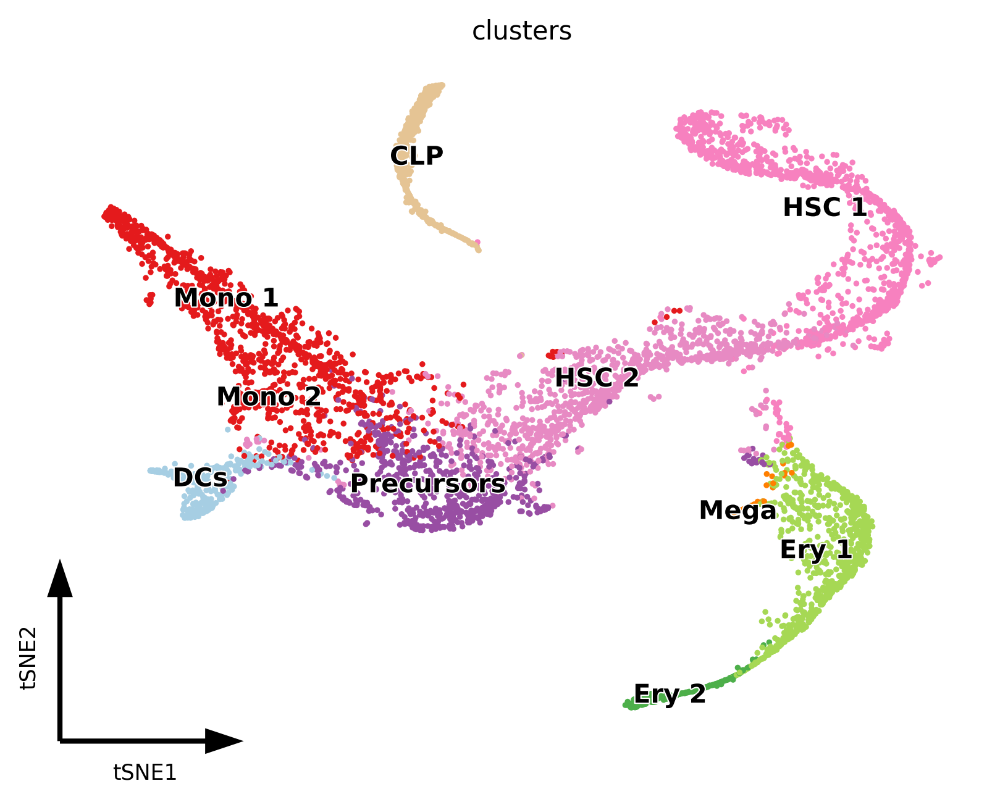

In [ ]:
scv.pl.tsne(adata, color='clusters', frameon='artist',dpi=300,save='D:/重要文件/小论文/图片/fig3/A.png')

# FIG3 B

computing velocity embedding
    finished (0:00:00) --> added
    'spliced_velocity_tsne', embedded velocity vectors (adata.obsm)
saving figure to file D:/重要文件/小论文/图片/fig3/BGTVelo.png


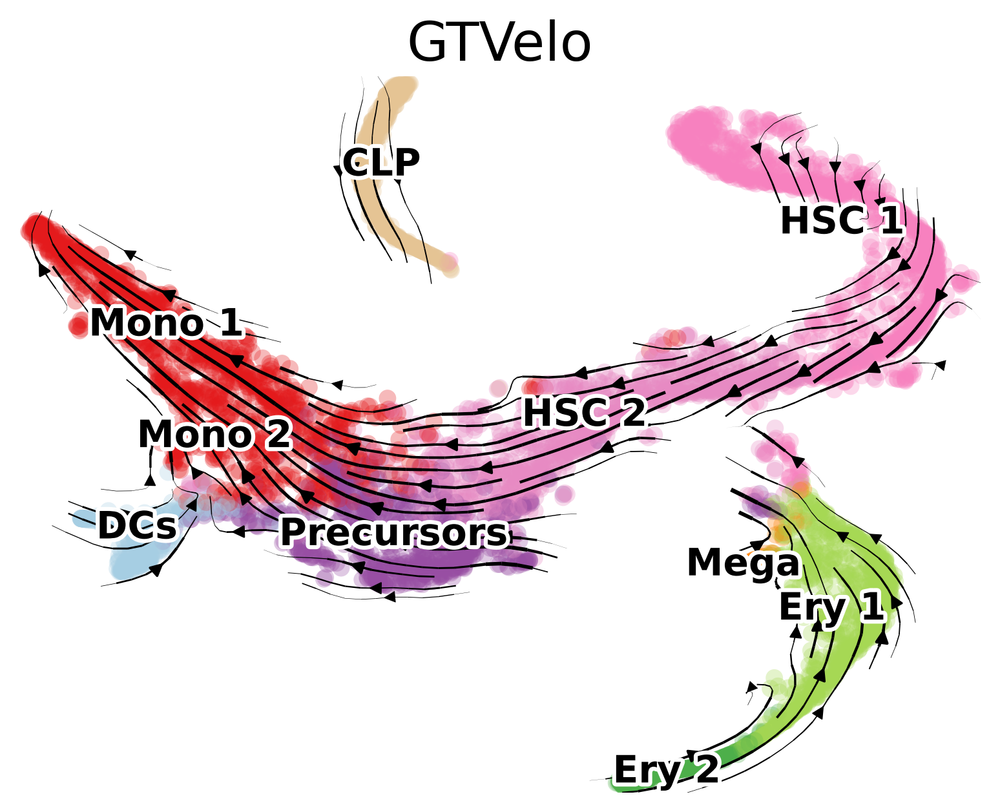

computing velocity embedding
    finished (0:00:01) --> added
    'stovelo_tsne', embedded velocity vectors (adata.obsm)
saving figure to file D:/重要文件/小论文/图片/fig3/BscVelo.png


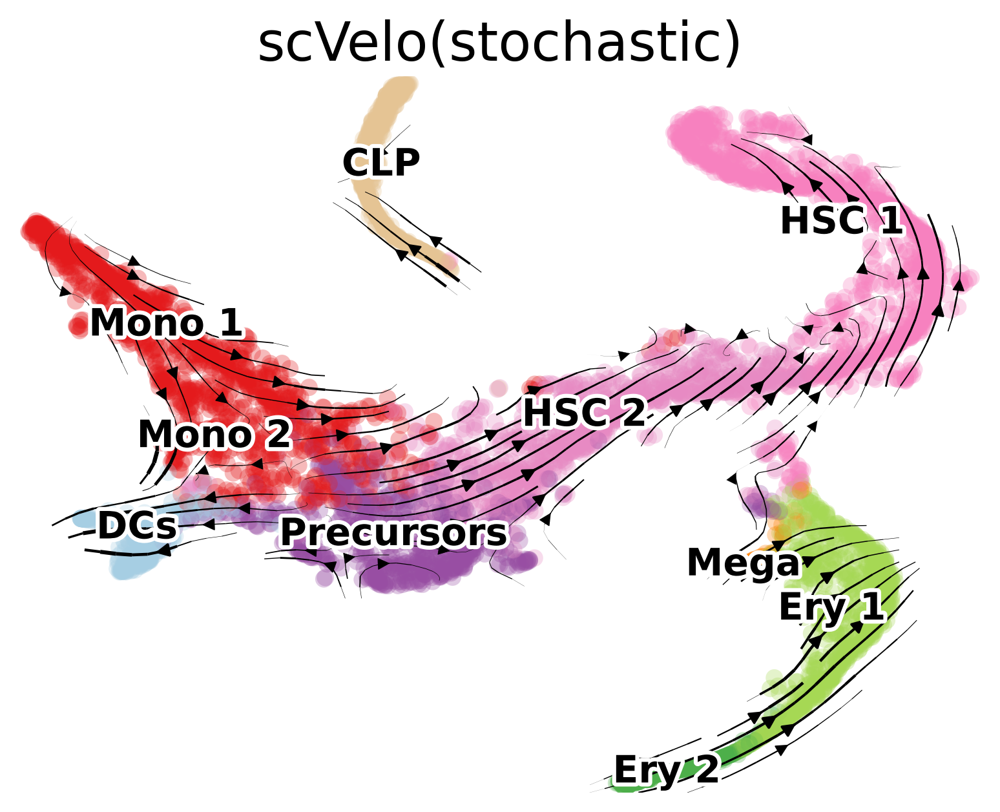

In [ ]:
import scanpy as sc
import scvelo as scv
import gtvelo as gtv
gt_bone_latent_adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\human_bonefina_latent_adata.h5ad")
scv.pl.velocity_embedding_stream(gt_bone_latent_adata, vkey='spliced_velocity', color=['clusters'],
    dpi=300,
    title='GTVelo',
    save='D:/重要文件/小论文/图片/fig3/BGTVelo.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 )
adata2 = sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\humanbone.h5ad")    
scv.pl.velocity_embedding_stream(adata2, vkey='stovelo', color=['clusters'],
    dpi=300,
    title='scVelo(stochastic)',
    save='D:/重要文件/小论文/图片/fig3/BscVelo.png',
    legend_fontsize=14, 
    legend_fontoutline=3 ,
    fontsize=20 )

    
    

# FIG3 C

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import scanpy as sc
import scipy

def calculate_velocity_expression_correlation(adata, velo_key='velo_s'):
    """
    计算每个基因的速度与表达量之间的斯皮尔曼相关系数
    """
    velocity = adata.layers[velo_key]
    expression = adata.layers['spliced']
    
    # 确保数据是numpy数组格式
    velocity = velocity.toarray() if scipy.sparse.issparse(velocity) else velocity
    expression = expression.toarray() if scipy.sparse.issparse(expression) else expression
    
    correlations = []
    gene_names = adata.var_names
    
    for i in range(velocity.shape[1]):
        # 直接使用numpy数组切片
        vel_data = velocity[:, i]
        exp_data = expression[:, i]
        # 移除任何NaN值
        mask = ~(np.isnan(vel_data) | np.isnan(exp_data))
        if mask.sum() > 1:  # 确保有足够的数据点计算相关系数
            corr, _ = stats.spearmanr(vel_data[mask], exp_data[mask])
        else:
            corr = np.nan
        correlations.append(corr)
    
    return pd.DataFrame({
        'gene': gene_names,
        'correlation': correlations,
    })

# 读取数据
adata1 = gt_bone_latent_adata  # 第一个数据集
adata2 = sc.read_h5ad(r"D:\code\mine\finish\latentvelo\lat_adata_latent\human_bonefina_adata.h5ad")
adata3 = sc.read_h5ad(r"D:\code\LatentVelo-main3\scvelo\humanbone.h5ad")
adata5=sc.read_h5ad(r"D:\code\mine\GTvelo2\unitvelo\uni_humanbone.h5ad")
adata6=sc.read_h5ad(r"D:\code\VeloAE-main\HSS\adata\veloae_humanbone.h5ad")
# 计算相关系数
corr_df1 = calculate_velocity_expression_correlation(adata1,'spliced_velocity')
corr_df2 = calculate_velocity_expression_correlation(adata2)
corr_df3 = calculate_velocity_expression_correlation(adata3, velo_key='stovelo')
corr_df4 = calculate_velocity_expression_correlation(adata3, velo_key='dynvelo')
# 绘制对比图
corr_df5 = calculate_velocity_expression_correlation(adata5, velo_key='velocity')
corr_df6 = calculate_velocity_expression_correlation(adata6, velo_key='new_velocity')

In [ ]:
adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\human_bonefina_adata.h5ad")
corr_df7 = calculate_velocity_expression_correlation(adata)

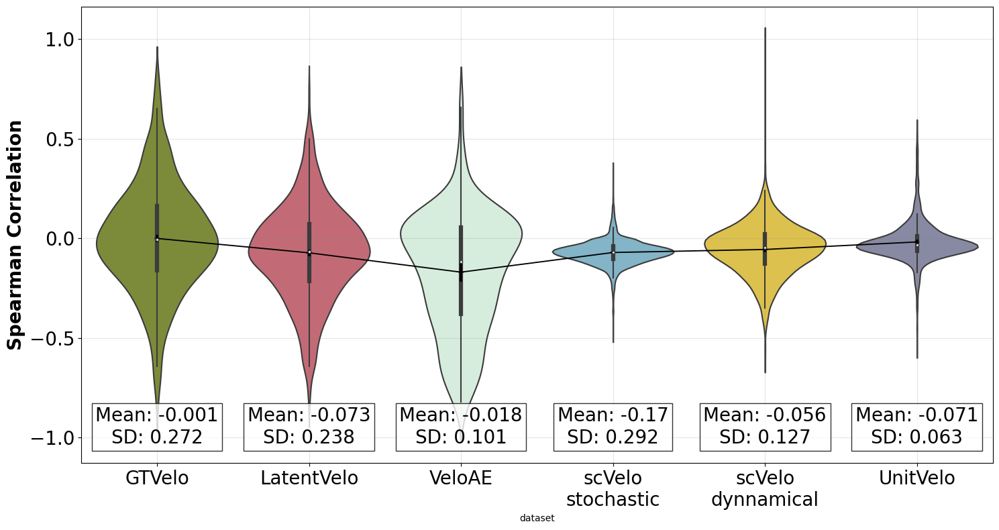

In [ ]:
def plot_enhanced_violin_comparison(correlation_dfs, dataset_names):
    """
    绘制增强版的小提琴图对比
    """
    # 准备数据
    for df, name in zip(correlation_dfs, dataset_names):
        df['dataset'] = name
    combined_df = pd.concat(correlation_dfs)
    
    # 计算统计信息
    stats_info = combined_df.groupby('dataset')['correlation'].agg(['mean', 'std']).round(3)
    
    # 设置图形风格和颜色
    plt.style.use('default')  # 使用默认白色背景
    colors = ['#85982C', '#D15C6B','#D2F1DC', '#78B9D2', '#F5CF36','#8386A8']
    
    # 创建图形
    plt.figure(figsize=(15, 8), facecolor='white')
    
    # 设置子图背景为白色
    ax = plt.gca()
    ax.set_facecolor('white')
    
    # 绘制小提琴图
    sns.violinplot(data=combined_df, x='dataset', y='correlation', 
                  palette=colors[:len(dataset_names)], 
                  inner='box',
                  scale='width')
    
    # 添加均值点和置信区间
    sns.pointplot(data=combined_df, x='dataset', y='correlation',
                 ci=95, color='black', scale=0.5,
                 markers='D', label='Mean with 95% CI')
    
    # 添加统计注释
    for idx, (name, row) in enumerate(stats_info.iterrows()):
        plt.text(idx, plt.ylim()[0] + 0.1, 
                f'Mean: {row["mean"]}\nSD: {row["std"]}',
                horizontalalignment='center',
                bbox=dict(facecolor='white', alpha=0.8),
                fontsize=20)
    
    # 美化图形
    #plt.title('Correlation Distribution Comparison Between Datasets', pad=20, fontsize=16, fontweight='bold')
    #plt.xlabel('Model', fontsize=20, fontweight='bold')
    plt.ylabel('Spearman Correlation', fontsize=20, fontweight='bold')
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    
    # 设置网格线为浅灰色
    plt.grid(True, alpha=0.2, color='gray')
    
    plt.tight_layout()
    return plt.gcf()
plot_enhanced_violin_comparison(
    [corr_df7, corr_df2 ,corr_df6,corr_df3,corr_df4,corr_df5,corr_df6],
    ['GTVelo', 'LatentVelo','VeloAE',  'scVelo\nstochastic','scVelo\ndynnamical','UnitVelo']
)
plt.savefig('D:/重要文件/小论文/图片/fig3/C.png', dpi=300)
plt.show()

# FIG3 D

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
from scipy import stats
import gseapy as gp
import os
from sklearn.preprocessing import StandardScaler
adata=sc.read_h5ad(r"D:\code\mine\GTvelo\1_adata_latentadata\human_bonefina_adata.h5ad")
def find_trajectory_degs(adata, trajectory, velo_key='velo_s', min_logfc=0.0001, pval_thresh=0.05):
    """
    Find differentially expressed genes along a trajectory
    
    Parameters:
    -----------
    adata : AnnData object
    trajectory : tuple
        Tuple of start and end cell types (e.g., ('HSC_1', 'Mega'))
    velo_key : str
        Key for velocity data in layers
    min_logfc : float
        Minimum log fold change threshold
    pval_thresh : float
        P-value threshold for significance
    """
    # Get cells from start and end points
    start_cells = adata[adata.obs['clusters'] == trajectory[0]].obs_names
    end_cells = adata[adata.obs['clusters'] == trajectory[1]].obs_names
    
    # Get velocity values
    velo_matrix = adata.layers[velo_key]
    
    # Calculate mean velocity for each group
    start_velo = velo_matrix[adata.obs_names.isin(start_cells)].mean(axis=0)
    end_velo = velo_matrix[adata.obs_names.isin(end_cells)].mean(axis=0)
    
    # Calculate log2 fold change
    epsilon = 1e-9  # Small constant to avoid log(0)
    logfc = np.log2((np.abs(end_velo) + epsilon) / (np.abs(start_velo) + epsilon))
    
    # Perform statistical test (Mann-Whitney U test)
    pvals = []
    for gene_idx in range(velo_matrix.shape[1]):
        start_vals = velo_matrix[adata.obs_names.isin(start_cells), gene_idx]
        end_vals = velo_matrix[adata.obs_names.isin(end_cells), gene_idx]
        stat, pval = stats.mannwhitneyu(start_vals, end_vals, alternative='two-sided')
        pvals.append(pval)
    
    # Create results DataFrame
    results = pd.DataFrame({
        'gene': adata.var_names,
        'log2fc': logfc,
        'pval': pvals
    })
    
    # Filter significant genes
    sig_degs = results[
        (abs(results['log2fc']) >= min_logfc) & 
        (results['pval'] <= pval_thresh)
    ]
    
    return sig_degs.sort_values('pval')

def run_go_analysis(gene_list, organism='human'):
    """
    Perform GO enrichment analysis on a list of genes
    
    Parameters:
    -----------
    gene_list : list
        List of gene symbols
    organism : str
        Organism name for GO analysis
    """
    # Run GO enrichment
    custom_temp_dir = r"D:\custom_temp_folder"
    if not os.path.exists(custom_temp_dir):
        os.makedirs(custom_temp_dir)
    enr = gp.enrichr(gene_list=gene_list,
                     gene_sets=['GO_Biological_Process_2021'],
                     organism=organism,
                     outdir=None,
                     no_plot=True,
                     cutoff=0.05)
    
    return enr.results

# Analyze each trajectory
trajectories = [('Ery_1', 'Ery_2'),('HSC_1', 'HSC_2'),('HSC_2','Precursors'),('Mono_2', 'Mono_1'),('Precursors','DCs')]
def analyze_all_trajectories(adata, trajectories):
    """
    Analyze all trajectories and return DEGs and GO results
    """
    all_results = {}
    
    for traj in trajectories:
        # Get DEGs
        degs = find_trajectory_degs(adata, traj)
        
        # Run GO analysis on up-regulated genes
        up_genes = degs[degs['log2fc'] > 0]['gene'].tolist()
        if up_genes:
            go_results_up = run_go_analysis(up_genes)
        else:
            go_results_up = pd.DataFrame()
            
        # Run GO analysis on down-regulated genes
        down_genes = degs[degs['log2fc'] < 0]['gene'].tolist()
        if down_genes:
            go_results_down = run_go_analysis(down_genes)
        else:
            go_results_down = pd.DataFrame()
            
        all_results[f"{traj[0]}_to_{traj[1]}"] = {
            'degs': degs,
            'go_up': go_results_up,
            'go_down': go_results_down
        }
    
    return all_results

# Run the analysis
results = analyze_all_trajectories(adata, trajectories)

d:\minetool\anaconda\envs\GTvelo\lib\site-packages\anndata\compat\__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['velo_s_graph'] that happens to be dimensioned at n_obs×n_obs (5780×5780).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
d:\minetool\anaconda\envs\GTvelo\lib\site-packages\anndata\compat\__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['velo_s_graph_neg'] that happens to be dimensioned at n_obs×n_obs (5780×5780).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
d:\minetool\anaconda\envs\GTvelo\lib\site-packages\gseapy\enrichr.py:427: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.results = self.results.append(res, ignore_index=True)
d:\minetool\anaconda\envs\GTvelo\lib\site-pack

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def plot_go_enrichment(results, save_path=None):
    """
    Plot GO enrichment results for all trajectories
    
    Parameters:
    -----------
    results : dict
        Dictionary containing GO analysis results for each trajectory
    save_path : str, optional
        Path to save the figure
    """
    # Create figure with subplots for each trajectory
    fig, axes = plt.subplots(len(results), 1, figsize=(9.2, len(results) * 6))
    #fig.suptitle('GO Term Enrichment Analysis Along Different Trajectories', fontsize=20)
    
    # Define new color palette
    colors = {'Up-regulated': '#CBC5D3', 'Down-regulated': '#D6E2EF'}
    
    # Plot for each trajectory
    for idx, (traj, data) in enumerate(results.items()):
        # Get top 10 GO terms for up and down regulated genes
        up_terms = data['go_up']
        down_terms = data['go_down']
        
        if not up_terms.empty:
            up_terms = up_terms.head(5)
        if not down_terms.empty:
            down_terms = down_terms.head(5)
            
        # Combine terms and add direction
        all_terms = pd.concat([
            up_terms.assign(Direction='Up-regulated'),
            down_terms.assign(Direction='Down-regulated')
        ])
        
        if not all_terms.empty:
            # Create bar plot
            y_pos = np.arange(len(all_terms))
            
            # Calculate -log10(p-value)
            log_pval = -np.log10(all_terms['Adjusted P-value'])
            
            # Plot
            bars = axes[idx].barh(y_pos, log_pval, 
                                color=[colors[d] for d in all_terms['Direction']])
            
            # Add text labels inside bars
            for bar, term, direction in zip(bars, all_terms['Term'], all_terms['Direction']):
                term_label = term.split(' (')[0]  # Remove 'GO:xxxx' part
                text_color = 'white' if direction == 'Up-regulated' else 'black'
                # axes[idx].text(bar.get_width() / 2, bar.get_y() + bar.get_height() / 2, 
                #                term_label, ha='center', va='center', color=text_color, fontsize=20)
                axes[idx].text(0.05, bar.get_y() + bar.get_height() / 2, 
                            term_label, ha='left', va='center', color=text_color, fontsize=20)
                axes[idx].barh(y_pos, [0]*len(log_pval), color='none')
                for i, (_, direction) in enumerate(all_terms['Direction'].items()):
                    axes[idx].axhspan(i-0.4, i+0.4, color=colors[direction], alpha=0.3)
                axes[idx].set_xlim(0, max(log_pval) * 1.2)
 
            # Customize plot
            axes[idx].set_yticks(y_pos,fontsize=30)
            #axes[idx].set_xticks(y_pos,fontsize=30)
            axes[idx].set_yticklabels([])  # Hide default y-axis labels
            axes[idx].set_xlabel('-log10(Adjusted P-value)', fontsize=20)
            axes[idx].tick_params(axis='x', labelsize=20)
            axes[idx].set_title(f'Trajectory: {traj}', fontsize=20)
             
    # Add unified legend
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor=colors['Up-regulated'], label='Up-regulated'),
                       Patch(facecolor=colors['Down-regulated'], label='Down-regulated')]
    fig.legend(handles=legend_elements, loc='upper center', fontsize=24, ncol=2, bbox_to_anchor=(0.5, -0.02))

    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    
    return fig, axes

# Plot enrichment results
fig, axes = plot_go_enrichment(results)#,save_path=r'D:/重要文件/小论文/图片/fig3/D.png' )

# Function to print detailed results
def print_trajectory_results(results):
    """Print detailed GO analysis results for each trajectory"""
    for traj, data in results.items():
        print(f"\nTrajectory: {traj}")
        print("\nTop UP-regulated GO terms:")
        if not data['go_up'].empty:
            print(data['go_up'][['Term', 'Adjusted P-value', 'Genes']].head().to_string())
        else:
            print("No significant UP-regulated terms")
            
        print("\nTop DOWN-regulated GO terms:")
        if not data['go_down'].empty:
            print(data['go_down'][['Term', 'Adjusted P-value', 'Genes']].head().to_string())
        else:
            print("No significant DOWN-regulated terms")
        print("\n" + "="*80)

# Print detailed results
print_trajectory_results(results)



Trajectory: Ery_1_to_Ery_2

Top UP-regulated GO terms:
                                                                           Term  Adjusted P-value           Genes
0                    negative regulation of cell junction assembly (GO:1901889)          0.153491     IKBKB;BCAS3
1  regulation of cell migration involved in sprouting angiogenesis (GO:0090049)          0.153491      HDAC5;AKT3
2                    regulation of intracellular protein transport (GO:0033157)          0.153491    BCAS3;CEP290
3                   positive regulation of intracellular transport (GO:0032388)          0.153491    BCAS3;CEP290
4                                regulation of filopodium assembly (GO:0051489)          0.153491  PPP1R16B;BCAS3

Top DOWN-regulated GO terms:
                                                                       Term  Adjusted P-value         Genes
0                                 keratinocyte differentiation (GO:0030216)          0.098827     BCR;EXPH5
1             

# FIG3 E

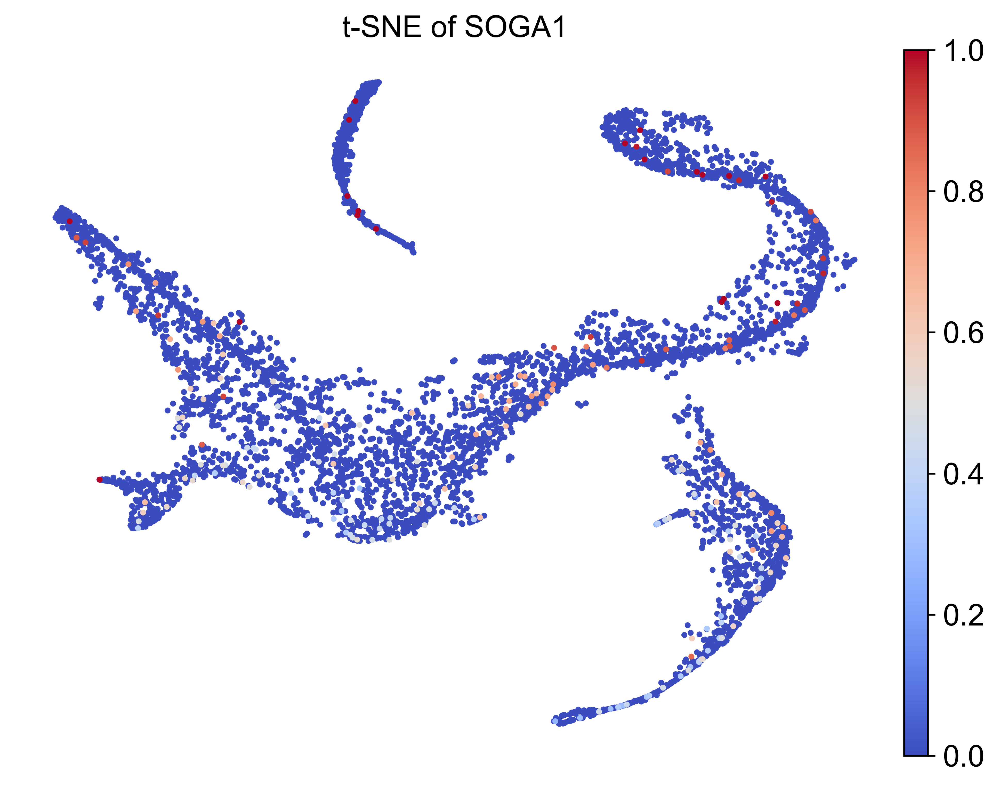

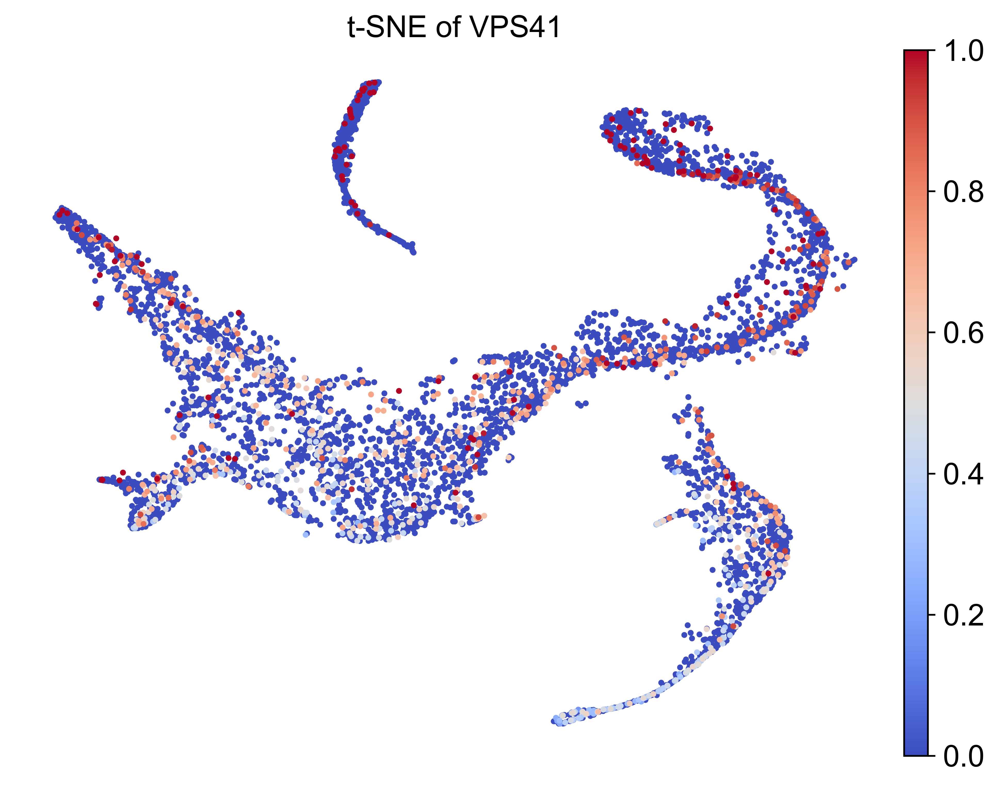

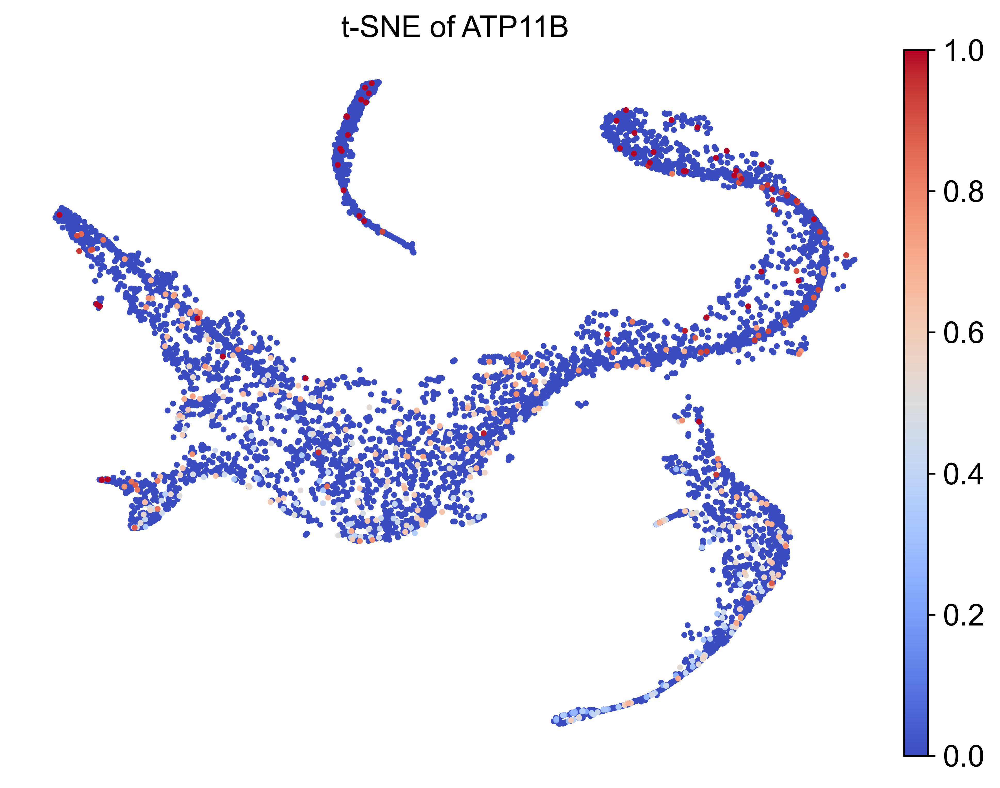

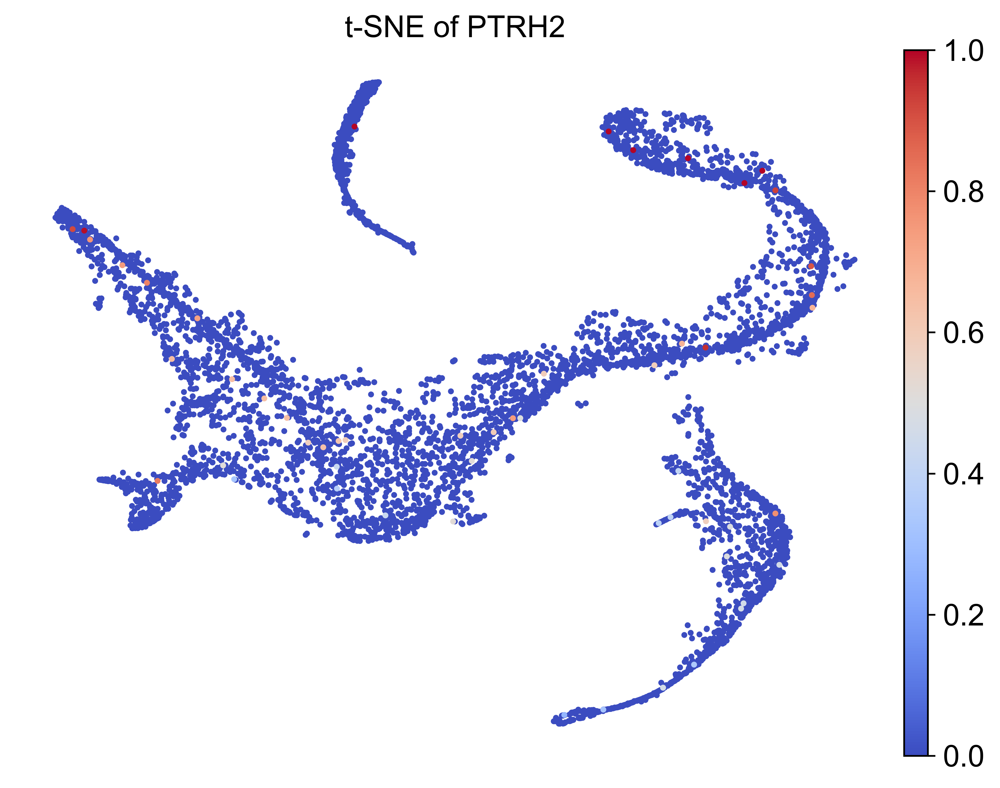

In [ ]:
import os
import scanpy as sc
import matplotlib as mpl
import shutil

# 设置全局 DPI 参数和文件格式
sc.set_figure_params(
    dpi=300, 
    format='png',
    figsize=(8, 6)  # 增加图形大小，第一个数字是宽度，第二个是高度
)  

genes_to_plot = ['SOGA1', 'VPS41', 'ATP11B', 'PTRH2']
for gene in genes_to_plot:
    # 设置保存路径
    save_path = f'D_{gene}'
    
    # 绘制图像
    sc.pl.embedding(
        adata,
        basis='X_tsne',
        color=gene,
        size=30,
        title=f"t-SNE of {gene}",
        vmin=0,
        vmax=1,
        cmap='coolwarm',
        vcenter=0.5,
        frameon=False,
        #add_colorbar=False,  # 修改这里来隐藏 colorbar
        #save=save_path
    )

# 移动文件部分
# target_dir = 'D:/重要文件/小论文/图片/fig3'
# os.makedirs(target_dir, exist_ok=True)

# # 修正文件名格式
# for gene in genes_to_plot:
#     source_file = f'./figures/X_tsneD_{gene}.png'  # 修正后的源文件名
#     target_file = os.path.join(target_dir, f'D_{gene}.png')
#     if os.path.exists(source_file):
#         shutil.move(source_file, target_file)

In [ ]:
for gene in genes_to_plot:
    source_file = f'./figures/X_tsneD_{gene}.pdf'
    target_file = os.path.join(target_dir, f'D_{gene}.png')
    if os.path.exists(source_file):
        shutil.move(source_file, target_file)

    else:
        print('1')